In [0]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn import preprocessing
import collections


In [30]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [31]:
open('/content/gdrive/My Drive/LAB/train-data.csv').read()

'0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,1,1,1,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,1,1,1,0,0,0,0,1,1,1,1,0,0,0,1,1,0,1,1,1,1,1,1,0,0,0\n0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0\n0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,1,1,1,0,0,0,1,1,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,0,0,0,1,1,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0\n0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,0,0,0,1,1,1,0,1,0,0,1,1,0,0,0,1,1,1,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [32]:
#Loading subsets
train_set = np.loadtxt("/content/gdrive/My Drive/LAB/train-data.csv", delimiter = ',')
test_set = np.loadtxt("/content/gdrive/My Drive/LAB/test-data.csv", delimiter = ',')
#Loading targets
train_targets = pd.read_csv("/content/gdrive/My Drive/LAB/train-target.csv", sep = ',', header = None)
test_targets = pd.read_csv("/content/gdrive/My Drive/LAB/train-target.csv", sep = ',', header = None)

print(train_set)
print(test_set)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[1. 1. 1. ... 1. 1. 0.]
 [0. 0. 1. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [0]:
#Labels binarizer
lb = preprocessing.LabelBinarizer()
lb.fit(train_targets[0])
target_train_matrix = lb.transform(train_targets)
target_test_matrix = lb.transform(test_targets)

In [34]:
target_train_matrix.shape

(41721, 26)

<Figure size 432x288 with 0 Axes>

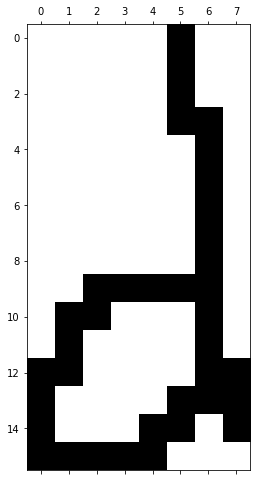

In [35]:
#Let's print one of the characters contained in the training set
x = train_set[0].reshape(16,8)
plt.gray()
plt.matshow(1.0 - x)
plt.show()
plt.close()

In [0]:
#Placeholders are variables without data assigned yet
x = tf.placeholder(tf.float32, [None, 128])
W = tf.Variable(tf.zeros([128, 26]))
b = tf.Variable(tf.zeros([26]))
y = tf.placeholder(tf.float32, [None, 26])
y_hat = tf.nn.softmax(tf.matmul(x, W)+b)

In [0]:
def next_batch(num, data, labels):
  idx = np.arange(0, len(data))
  np.random.shuffle(idx)
  idx = idx[:num]
  data_shuffle = [data[ i] for i in idx]
  labels_shuffle = [labels[ i] for i in idx]

  return np.asarray(data_shuffle), np.asarray(labels_shuffle)

In [0]:
#Initialization of weights
tf.set_random_seed(1234)

def weight_variable(shape):
  initial = tf.truncated_normal(shape, stddev=0.1)
  return tf.Variable(initial)

In [0]:
#Initialization of Bias
def bias_variable(shape):
  initial = tf.constant(0.1, shape = shape)
  return tf.Variable(initial)
def conv2d(x, W):
  return tf.nn.conv2d(x, W, strides = [1,1,1,1], padding = 'SAME', use_cudnn_on_gpu = False)
def max_pool_2x2(x):
  return tf.nn.max_pool(x, ksize = [1,2,2,1], strides = [1,2,2,1], padding = 'SAME')
def conv3d(x, W):
  return tf.nn.conv3d(x, W, strides  = [1,1,1,1], padding = 'SAME', use_cudnn_on_gpu = False)

In [0]:
#Structure
x_image = tf.reshape(x, [-1,16,8,1])

In [0]:
#1st CONVOLUTIONAL LAYER
W_conv1 = weight_variable([5,5,1,32])
b_conv1 = bias_variable([32])

In [0]:
h_conv1 = tf.nn.leaky_relu(conv2d(x_image, W_conv1)+b_conv1)
h_pool1 = max_pool_2x2(h_conv1)

In [0]:
#2nd CONVOLUTIONAL LAYER
W_conv2 = weight_variable([5,5,32,64])
b_conv2 = bias_variable([64])

In [0]:
h_conv2 = tf.nn.relu(conv2d(h_pool1, W_conv2) + b_conv2)
h_pool2 = max_pool_2x2(h_conv2)

In [0]:
#Flat layer
W_fc1 = weight_variable([4*2*64, 512])
b_fc1 = bias_variable([512])

In [0]:
#Max pool for the flat layer
h_pool2_flat = tf.reshape(h_pool2, [-1, 4*2*64])
h_fc1 = tf.nn.relu(tf.matmul(h_pool2_flat, W_fc1)+ b_fc1)

In [65]:
#Dropout layer
keep_prob = tf.placeholder(tf.float32)
h_fc1_drop = tf.nn.dropout(h_fc1, keep_prob)


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [0]:
#Output dense node
W_fc2 = weight_variable([512, 26])
b_fc2 = bias_variable([26])

In [0]:
#Output nodes
y_conv = tf.matmul(h_fc1_drop, W_fc2) + b_fc2
y_hat = tf.nn.softmax(y_conv)

In [0]:
cross_entropy = tf.reduce_mean(-tf.reduce_sum(y * tf.log(y_hat), reduction_indices = [1]))

In [0]:
train_step = tf.train.AdamOptimizer(1e-4).minimize(cross_entropy)

In [0]:
predicted_y = tf.argmax(y_hat, 1)
real_y = tf.argmax(y, 1)
correct_prediction = tf.equal(predicted_y, real_y)
accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

In [71]:
batch_size_train = 20
epochs = train_set.shape[0]//batch_size_train
sess = tf.InteractiveSession()
print(epochs, train_set.shape[0])


2086 41721


In [73]:
#TRAINING AND TESTING 1
sess.run(tf.global_variables_initializer())
for i in range(epochs):
  batch = next_batch(batch_size_train, train_set, target_train_matrix)
  if i % 100 == 0:
    print(type(batch[1]))
    train_accuracy = accuracy.eval(feed_dict = {x: batch[0], y: batch[1], keep_prob: 1.0})
    print("Step {}, Training Accuracy {}".format(i, train_accuracy))

  train_step.run(feed_dict = {x: batch[0], y: batch[1], keep_prob: 0.5})

<class 'numpy.ndarray'>
Step 0, Training Accuracy 0.05000000074505806
<class 'numpy.ndarray'>
Step 100, Training Accuracy 0.05000000074505806
<class 'numpy.ndarray'>
Step 200, Training Accuracy 0.25
<class 'numpy.ndarray'>
Step 300, Training Accuracy 0.6499999761581421
<class 'numpy.ndarray'>
Step 400, Training Accuracy 0.4000000059604645
<class 'numpy.ndarray'>
Step 500, Training Accuracy 0.699999988079071
<class 'numpy.ndarray'>
Step 600, Training Accuracy 0.699999988079071
<class 'numpy.ndarray'>
Step 700, Training Accuracy 0.75
<class 'numpy.ndarray'>
Step 800, Training Accuracy 0.75
<class 'numpy.ndarray'>
Step 900, Training Accuracy 0.5
<class 'numpy.ndarray'>
Step 1000, Training Accuracy 0.550000011920929
<class 'numpy.ndarray'>
Step 1100, Training Accuracy 0.8999999761581421
<class 'numpy.ndarray'>
Step 1200, Training Accuracy 0.800000011920929
<class 'numpy.ndarray'>
Step 1300, Training Accuracy 0.8500000238418579
<class 'numpy.ndarray'>
Step 1400, Training Accuracy 0.75
<clas

In [0]:
accuracy_values = []
predicted_targets = []


In [79]:
batch_size_test = 61
for j in range(9*19):
  batch = next_batch(batch_size_test, test_set, target_test_matrix)
  b_acc, b_pred_y = sess.run([accuracy, predicted_y], feed_dict ={x: batch[0], y: batch[1], keep_prob: 1.0})

  accuracy_values.append(b_acc)
  predicted_targets.extend(b_pred_y)

print('test accuracy {}'.format(np.mean(accuracy_values)))

test accuracy 0.06015722453594208


In [85]:
#Cross validation over the rate learning
rates = [1e-3, 5e-4, 1e-4, 6e-4]

from sklearn.model_selection import KFold

kf = KFold(n_splits = 4)

#Algorithm
cv_scores = []

for rate in rates:
  print("Cross Validation for parameter rate = {}".format(rate))
  acc_list = []
  train_step = tf.train.AdamOptimizer(rate).minimize(cross_entropy)

  for train, val in kf.split(train_set):
    CV_EPOCHS = epochs
    sess.run(tf.global_variables_initializer())
    t_data = train_set[train]
    v_data = train_set[val]
    t_labels = target_train_matrix[train]
    v_labels = target_train_matrix[val]

    for i in range(CV_EPOCHS):
      j, k = i*batch_size_train, (i+1)*batch_size_train
      train_step.run(feed_dict = {x: t_data[j:k], y: t_labels[j:k], keep_prob: 0.5})

    acc = sess.run(accuracy, feed_dict = {x: v_data, y: v_labels, keep_prob: 1.0})
    acc_list.append(acc)
    print("CV accuracy: {}".format(acc))

  cv_scores.append(acc_list)

Cross Validation for parameter rate = 0.001
CV accuracy: 0.863675594329834
CV accuracy: 0.8407478332519531
CV accuracy: 0.8319271206855774
CV accuracy: 0.8721956014633179
Cross Validation for parameter rate = 0.0005
CV accuracy: 0.835777997970581
CV accuracy: 0.8288590312004089
CV accuracy: 0.8094918727874756
CV accuracy: 0.8484179973602295
Cross Validation for parameter rate = 0.0001
CV accuracy: 0.7337743043899536
CV accuracy: 0.7396931648254395
CV accuracy: 0.7438158988952637
CV accuracy: 0.7377756237983704
Cross Validation for parameter rate = 0.0006
CV accuracy: 0.8438308835029602
CV accuracy: 0.8293384313583374
CV accuracy: 0.8395973443984985
CV accuracy: 0.84947270154953


In [0]:
cv_scores = np.array(cv_scores)
np.savetxt("/content/gdrive/My Drive/LAB/cv_scores.txt", cv_scores)


In [87]:
mean_cv_acc = np.apply_along_axis(np.mean, 1, cv_scores)
best_rate = rates[mean_cv_acc.argmax()]
best_rate

0.001

In [88]:
print(mean_cv_acc[0], mean_cv_acc[1], mean_cv_acc[2], mean_cv_acc[3])

0.8521365 0.83063674 0.7387647 0.8405599


In [90]:
#TRAINING AND TESTING USING THE BEST LEARNING RATE
train_step = tf.train.AdamOptimizer(best_rate).minimize(cross_entropy)

sess.run(tf.global_variables_initializer())
for i in range(epochs):
    batch = next_batch(batch_size_train,train_set,target_train_matrix)
    if i % 100 == 0:
        print(type(batch[1]))
        train_accuracy = accuracy.eval(
            feed_dict={x: batch[0], 
                       y: batch[1], 
                       keep_prob: 1.0})
        print('step {}, training accuracy {}'.format(i, 
                                                     train_accuracy))
    train_step.run(feed_dict={x: batch[0], 
                              y: batch[1], 
                              keep_prob: 0.5})
    
accuracy_values = []
predicted_targets = []

batch_size_test = 61
for j in range(9*19):
  batch = next_batch(batch_size_test, test_set, target_test_matrix)
  b_acc, b_pred_y = sess.run([accuracy, predicted_y], feed_dict = {x: batch[0], y: batch[1], keep_prob: 1.0})

  accuracy_values.append(b_acc)
  predicted_targets.extend(b_pred_y)

print("Test Accuracy {}".format(np.mean(accuracy_values)))
    


<class 'numpy.ndarray'>
step 0, training accuracy 0.05000000074505806
<class 'numpy.ndarray'>
step 100, training accuracy 0.550000011920929
<class 'numpy.ndarray'>
step 200, training accuracy 0.6499999761581421
<class 'numpy.ndarray'>
step 300, training accuracy 0.800000011920929
<class 'numpy.ndarray'>
step 400, training accuracy 0.75
<class 'numpy.ndarray'>
step 500, training accuracy 0.8999999761581421
<class 'numpy.ndarray'>
step 600, training accuracy 0.800000011920929
<class 'numpy.ndarray'>
step 700, training accuracy 0.949999988079071
<class 'numpy.ndarray'>
step 800, training accuracy 0.8500000238418579
<class 'numpy.ndarray'>
step 900, training accuracy 1.0
<class 'numpy.ndarray'>
step 1000, training accuracy 0.800000011920929
<class 'numpy.ndarray'>
step 1100, training accuracy 0.75
<class 'numpy.ndarray'>
step 1200, training accuracy 0.949999988079071
<class 'numpy.ndarray'>
step 1300, training accuracy 0.8500000238418579
<class 'numpy.ndarray'>
step 1400, training accuracy

In [0]:
#Back to readable format
from string import ascii_lowercase
pred_letters = [ascii_lowercase[i] for i in predicted_targets]
pd.DataFrame(pred_letters).to_csv("/content/gdrive/My Drive/LAB/final_predictions.csv", header = False, index = False)
pd.DataFrame(pred_letters).to_csv("/content/gdrive/My Drive/LAB/final_predictions_csv.txt", header = False, index = False)